In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
train_path = "/content/drive/MyDrive/best_model/train"

test_path = "/content/drive/MyDrive/best_model/test"

In [3]:
from imutils import paths
import random
SEED=10

imagePaths_train = sorted(list(paths.list_images(train_path)))
random.seed(SEED)
random.shuffle(imagePaths_train)
imagePaths_train[:5]

['/content/drive/MyDrive/best_model/train/dog.12416.jpg',
 '/content/drive/MyDrive/best_model/train/dog.12296.jpg',
 '/content/drive/MyDrive/best_model/train/dog.12256.jpg',
 '/content/drive/MyDrive/best_model/train/dog.12355.jpg',
 '/content/drive/MyDrive/best_model/train/dog.12493.jpg']

# New section

# New section

In [19]:
import cv2
from tensorflow.keras.preprocessing.image import img_to_array

image = cv2.imread(imagePaths_train[0])
print("Shape of image = ", image.shape)

image = cv2.resize(image,(28,28))
print("Shape of resize image = ", image.shape)

image = img_to_array(image)

image


Shape of image =  (374, 500, 3)
Shape of resize image =  (28, 28, 3)


array([[[ 99.,  83., 146.],
        [ 90.,  83., 144.],
        [101., 101., 161.],
        ...,
        [ 31.,  29., 125.],
        [ 26.,  24., 120.],
        [ 27.,  25., 121.]],

       [[ 91.,  84., 143.],
        [ 64.,  53., 114.],
        [ 86.,  86., 141.],
        ...,
        [ 28.,  27., 125.],
        [ 26.,  25., 123.],
        [ 27.,  26., 122.]],

       [[110., 106., 161.],
        [ 86.,  90., 141.],
        [ 54.,  51.,  97.],
        ...,
        [ 36.,  35., 137.],
        [ 29.,  29., 127.],
        [ 32.,  29., 123.]],

       ...,

       [[ 75.,  58.,  96.],
        [ 59.,  54.,  86.],
        [ 49.,  47.,  83.],
        ...,
        [197., 188., 198.],
        [177., 162., 170.],
        [173., 159., 171.]],

       [[ 68.,  56.,  87.],
        [ 59.,  48.,  81.],
        [ 54.,  47.,  80.],
        ...,
        [188., 178., 190.],
        [180., 165., 173.],
        [171., 160., 170.]],

       [[ 64.,  48.,  88.],
        [ 55.,  46.,  79.],
        [ 54.,  

In [20]:
import os
imagePaths_train[0].split("/")[-1].split(".")[0]

'dog'

In [21]:
from tqdm import tqdm_notebook as tqdm

# initialize the data and labels
print("[INFO] loading images...")
train_X = []
train_Y = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(train_path)))
random.seed(SEED)
random.shuffle(imagePaths)

# progress bar
with tqdm(total=len(imagePaths)) as pbar:
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        train_X.append(image)

        # extract the class label from the image path and update the
        # labels list
        label = imagePath.split(os.path.sep)[-1].split(".")[0]

        if label == "cat":
            label = 0
        elif label == "dog":
            label = 1

        # print("pr: ", label)
        train_Y.append(label)

        # update the progressbar
        pbar.update(1)

[INFO] loading images...


<ipython-input-21-9e038fc43c32>:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  with tqdm(total=len(imagePaths)) as pbar:


  0%|          | 0/297 [00:00<?, ?it/s]

In [22]:
import numpy as np
train_X = np.array(train_X, dtype="float") / 255.0
train_Y = np.array(train_Y)

from sklearn.model_selection import train_test_split
(trainX, valX, trainY, valY) = train_test_split(train_X, train_Y, test_size=0.40, random_state=SEED)

In [23]:
train_X.shape

(297, 28, 28, 3)

In [24]:
trainX.shape

(178, 28, 28, 3)

In [25]:
valX.shape

(119, 28, 28, 3)

In [26]:
test_X.shape

(64, 28, 28, 3)

In [27]:
valY

array([1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1])

In [28]:

from tensorflow.keras.utils import to_categorical
trainY = to_categorical(trainY, num_classes=2)
valY = to_categorical(valY, num_classes=2)

In [29]:
valY

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.

In [30]:
trainY

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.

In [31]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

aug = ImageDataGenerator(rotation_range=30,
                         width_shift_range=0.1,
                         height_shift_range=0.1,
                         shear_range=0.2,
                         zoom_range=0.2,
                         horizontal_flip=True,
                         fill_mode="nearest")

In [32]:
EPOCHS = 10
INIT_LR = 1e-3
BS = 2

In [33]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import MaxPooling2D

In [34]:
# create CNN Model

class LeNet:
    @staticmethod
    def build(width, height, depth, classes):
        # initialize the model
        model = Sequential()                ## siamese networks
        inputShape = (height, width, depth)

        # if we are using "channels first", update the input shape
        print(K.image_data_format())
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))
        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model

In [35]:
# initialize the model
print("[INFO] compiling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=2)
opt = Adam(learning_rate=INIT_LR)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
print("[INFO] model complied...")

[INFO] compiling model...
channels_last
[INFO] model complied...


In [36]:
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 28, 28, 20)        1520      
                                                                 
 activation_4 (Activation)   (None, 28, 28, 20)        0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 20)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 50)        25050     
                                                                 
 activation_5 (Activation)   (None, 14, 14, 50)        0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 7, 7, 50)         0         
 2D)                                                  

In [37]:
BS = 2

print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(valX, valY),
              steps_per_epoch=len(trainX) // BS,
              epochs=EPOCHS,
              verbose=1)

[INFO] training network...
Epoch 1/10
89/89 [==============================] - 5s 32ms/step - loss: 0.5850 - accuracy: 0.8034 - val_loss: 0.4859 - val_accuracy: 0.8655
Epoch 2/10
89/89 [==============================] - 2s 26ms/step - loss: 0.5227 - accuracy: 0.8146 - val_loss: 0.4265 - val_accuracy: 0.8655
Epoch 3/10
89/89 [==============================] - 2s 25ms/step - loss: 0.4835 - accuracy: 0.8146 - val_loss: 0.4382 - val_accuracy: 0.8655
Epoch 4/10
89/89 [==============================] - 3s 35ms/step - loss: 0.4812 - accuracy: 0.8146 - val_loss: 0.4260 - val_accuracy: 0.8655
Epoch 5/10
89/89 [==============================] - 3s 34ms/step - loss: 0.4819 - accuracy: 0.8146 - val_loss: 0.4669 - val_accuracy: 0.8655
Epoch 6/10
89/89 [==============================] - 2s 24ms/step - loss: 0.4943 - accuracy: 0.8146 - val_loss: 0.4288 - val_accuracy: 0.8655
Epoch 7/10
89/89 [==============================] - 2s 25ms/step - loss: 0.5100 - accuracy: 0.8146 - val_loss: 0.4128 - val_acc

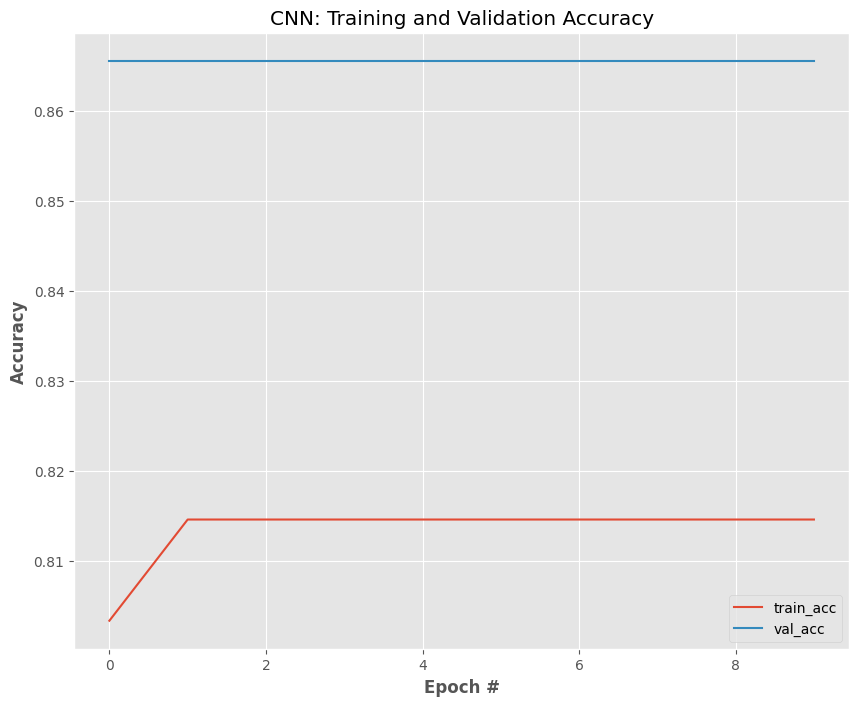

In [38]:
# plot the training and validation accuracy
import matplotlib.pyplot as plt
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

In [39]:
model.save("/content/drive/MyDrive/best_model/cat_dog_new.model")

In [40]:
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/best_model/cat_dog_new.model")

In [41]:
import imutils
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid()
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading images...


<ipython-input-47-c6cc897fc0ec>:15: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  with tqdm(total=len(imagePaths)) as pbar:


  0%|          | 0/64 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


<ipython-input-41-e21b386403f6>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,10))


1/1 [==============================] - 0s 27ms/step


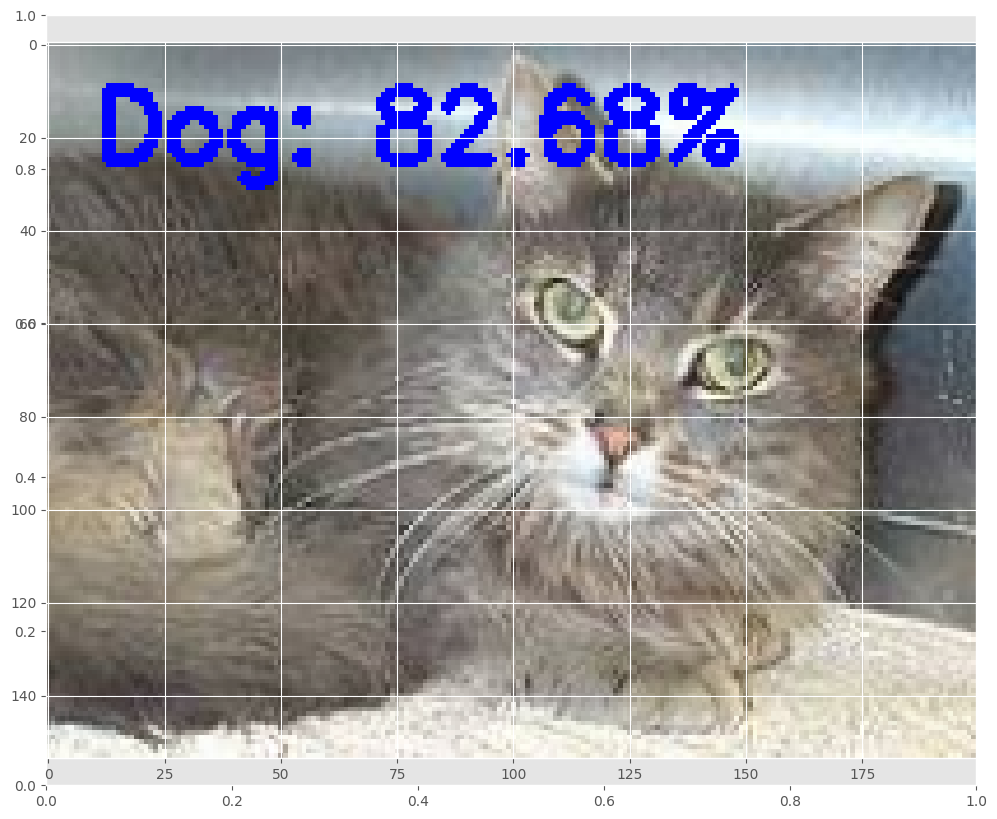

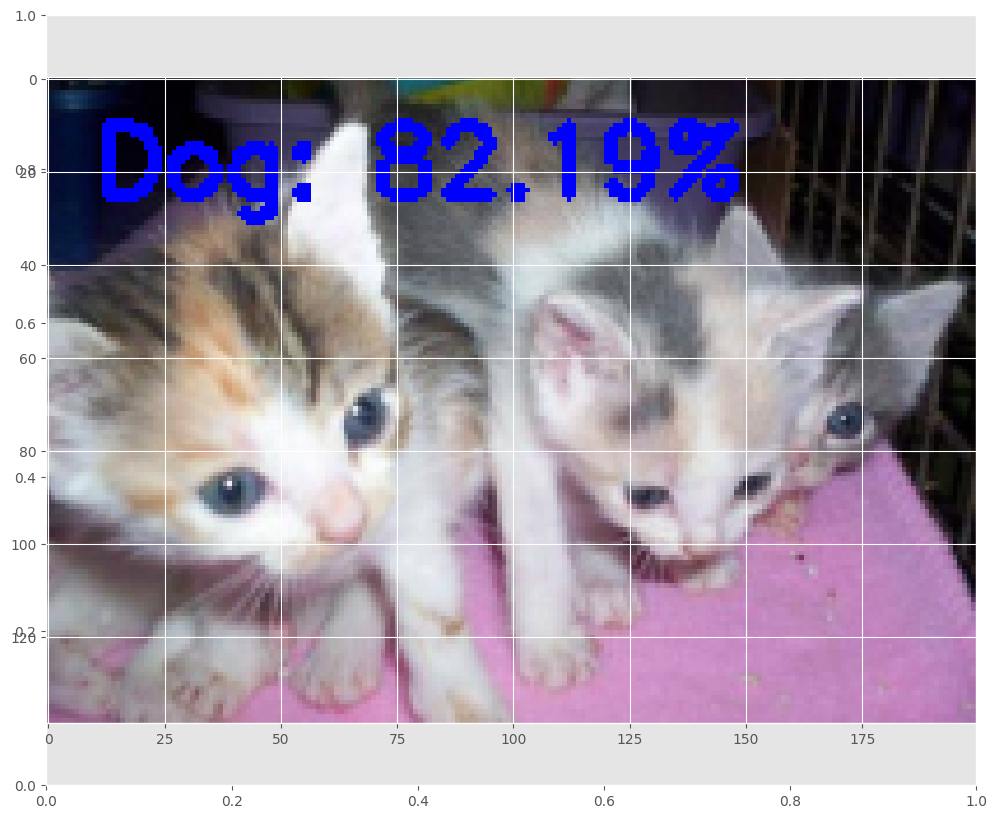

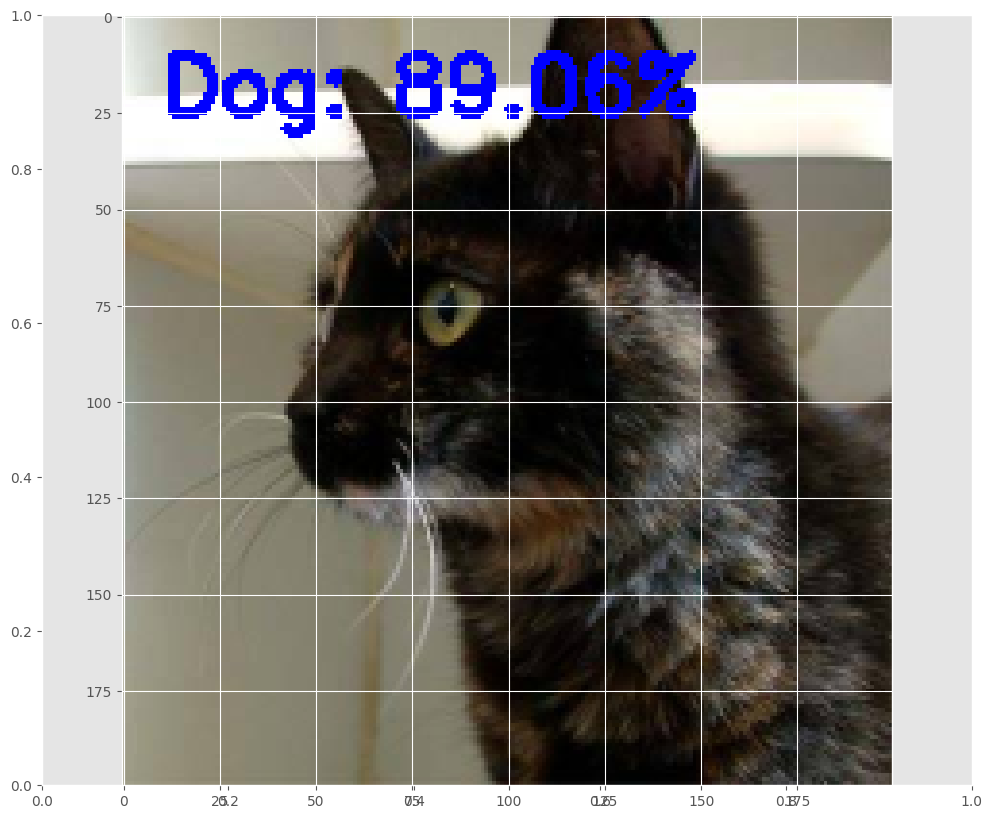

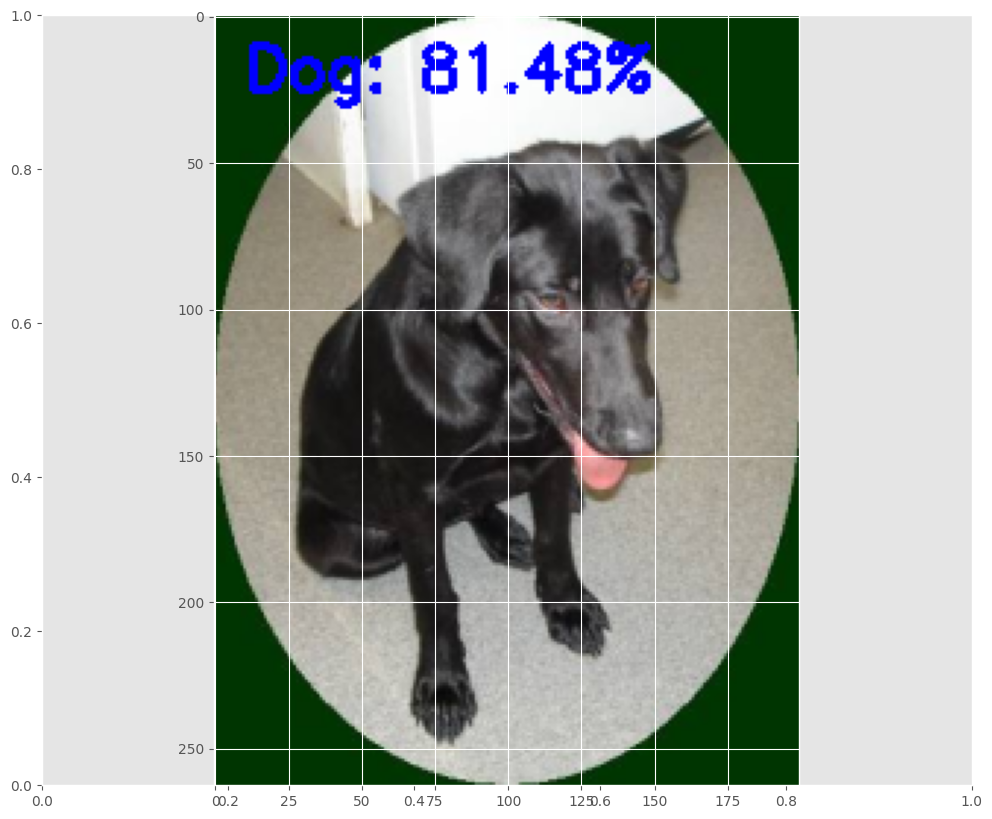

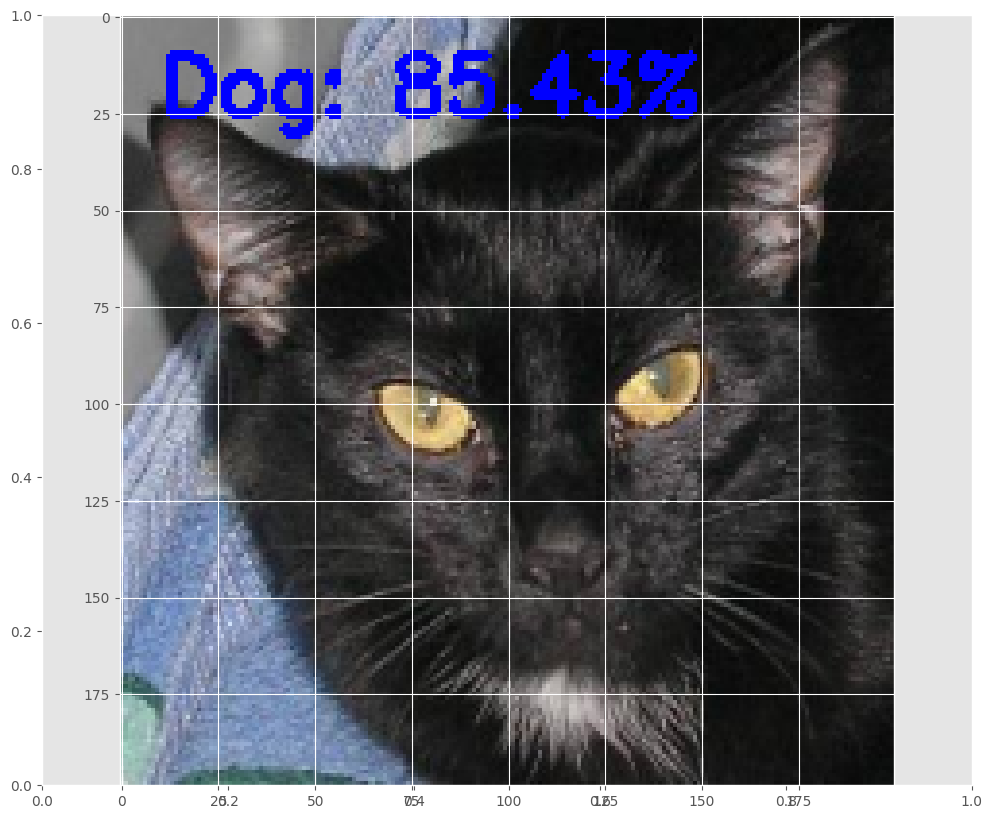

...

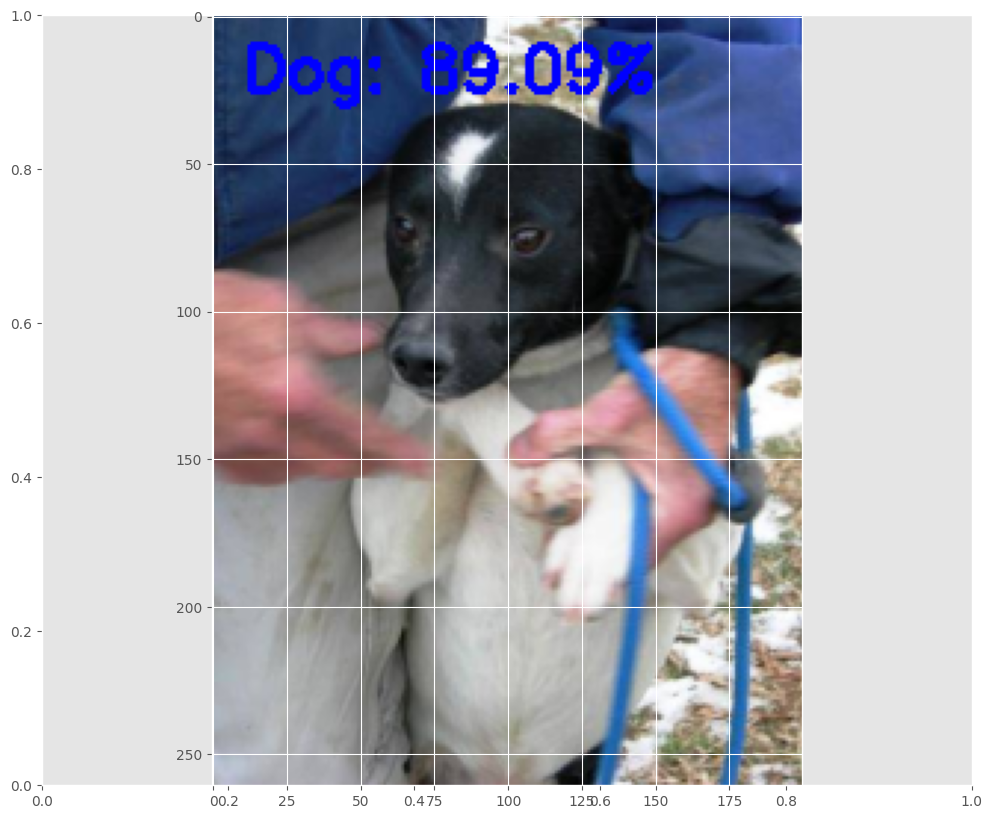

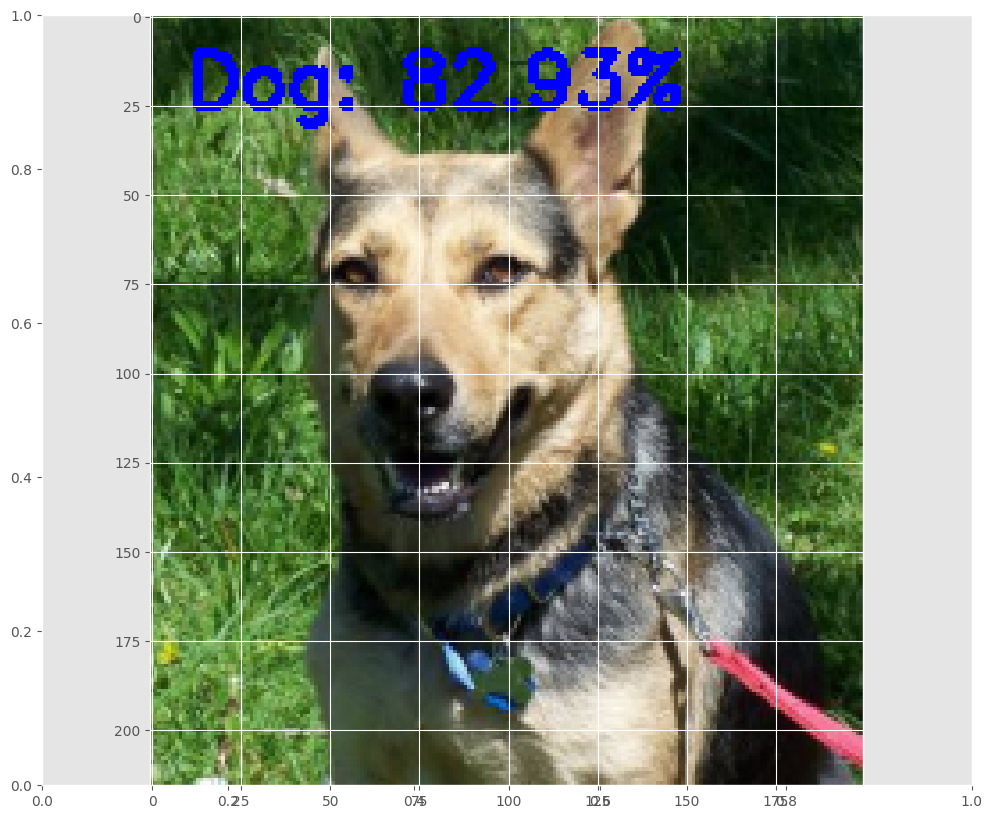

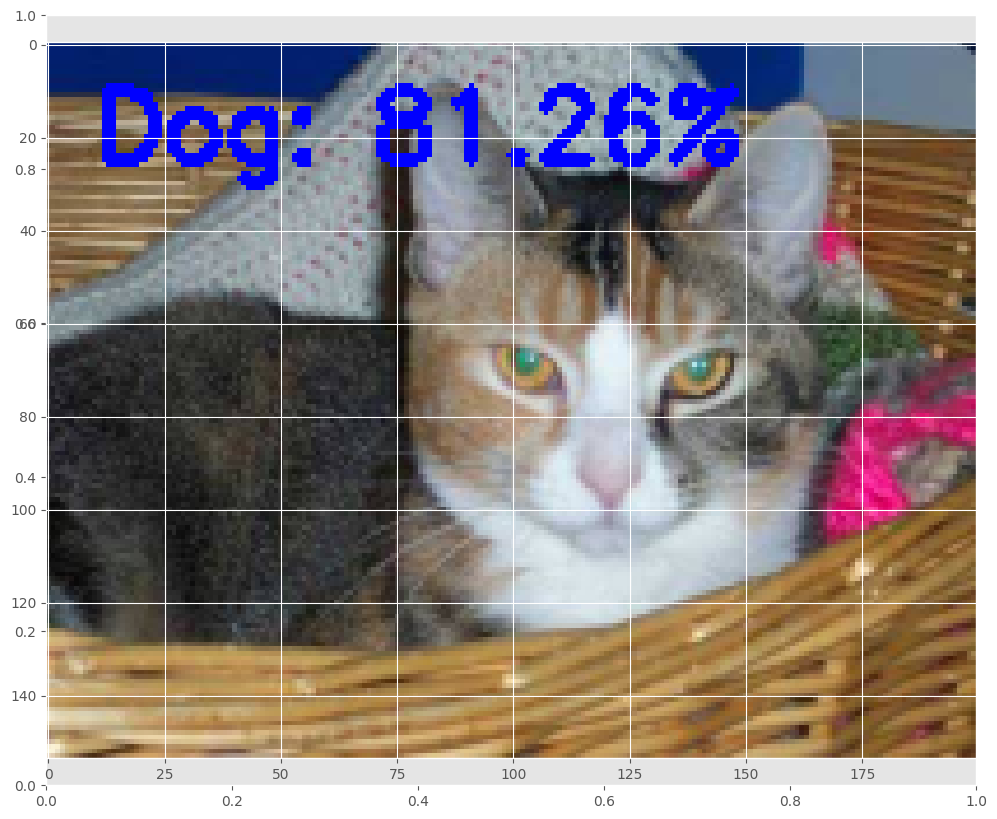

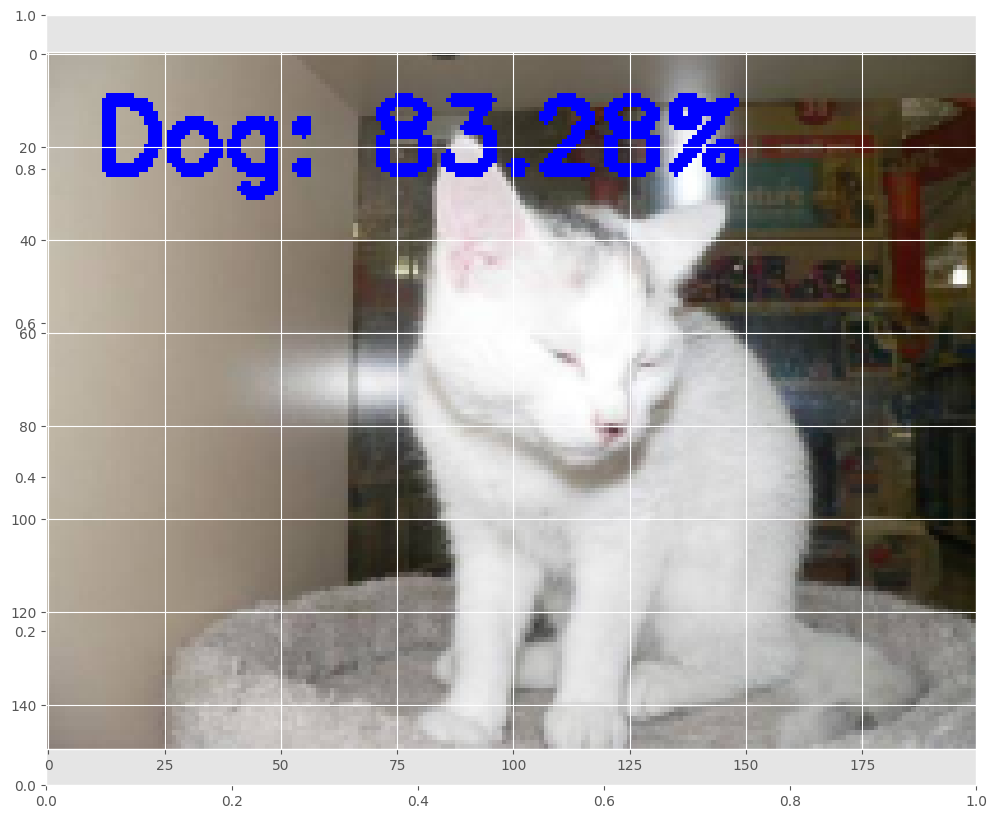

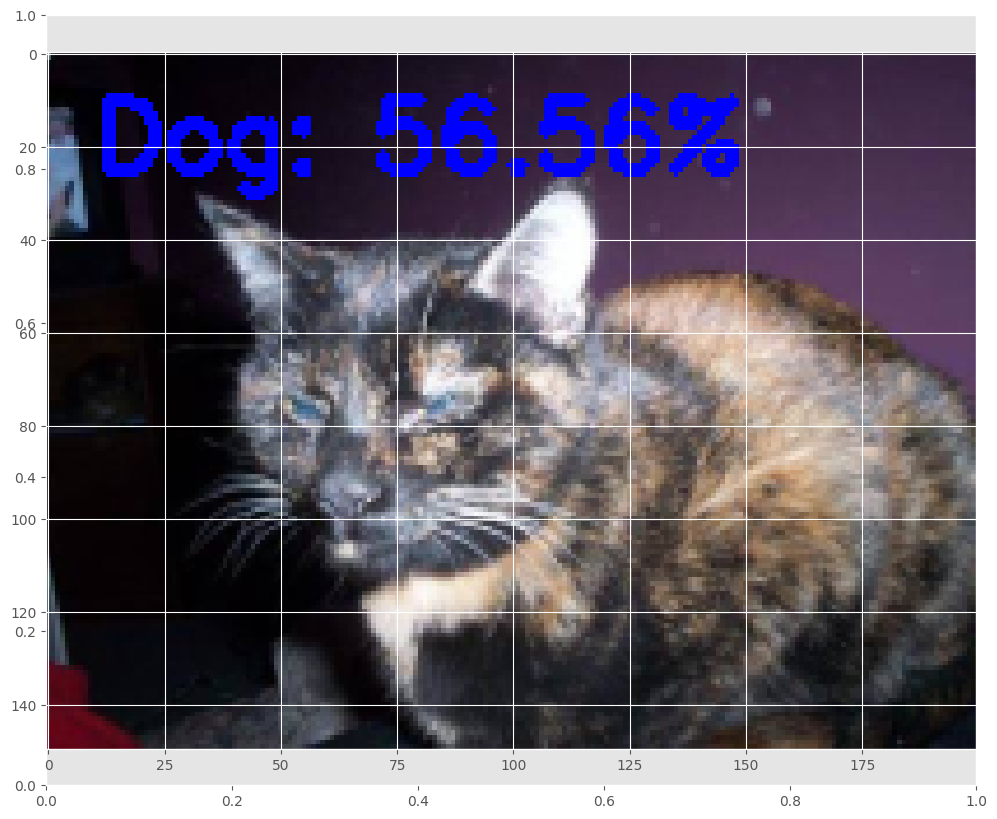

In [47]:
from tqdm import tqdm_notebook as tqdm

# initialize the data and labels
print("[INFO] loading images...")

predicted_label = []
image_numbers = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(test_path)))
random.seed(SEED)
random.shuffle(imagePaths)

# progress bar
with tqdm(total=len(imagePaths)) as pbar:
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        orig = image.copy()
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        image_number = imagePath.split("/")[-1].split(".")[0]
        image_numbers.append(image_number)

        # classify the input image
        prd_conf = model.predict(image)[0]

        all_class = ["Cat","Dog"]
        # build the label
        label = all_class[np.argmax(prd_conf)]
        predicted_label.append(label)
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=200)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 0, 0), 2)

        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

        pbar.update(1)


In [48]:
predicted_label

['Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog',
 'Dog']

In [49]:
import pandas as pd
df = pd.DataFrame({"Id":image_numbers,"label":predicted_label})
df

,Id,label
0,7,Dog
1,55,Dog
2,5,Dog
3,48,Dog
4,58,Dog
...,...,...
59,1,Dog
60,42,Dog
61,37,Dog
62,34,Dog


In [50]:
df.replace({"Cat":0,"Dog":1},inplace=True)

In [51]:
df.head()

,Id,label
0,7,1
1,55,1
2,5,1
3,48,1
4,58,1
